In [1]:
import os
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib as mpl
import cell2location as cell2loc

/home/agathes/miniconda3/envs/cell2loc_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/agathes/miniconda3/envs/cell2loc_env/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/home/agathes/miniconda3/envs/cell2loc_env/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


In [2]:
slides = [
    "17P04394",
    "18P06762",
    "18P08140",
    "18P06593",
    "18P03122",
    "18P02831",
    "17P02529",
]

In [3]:
for slide in slides:
    nuc_segm_dir = (
        "/home/agathes/work/results/spatialscope_deconv/third_run/deconv_normalised"
    )
    nuc_segm_dir = os.path.join(nuc_segm_dir, slide, "sp_adata_ns.h5ad")
    sp_nuc_adata = sc.read_h5ad(nuc_segm_dir)
    N_cells_spot_nuc_seg = round(sp_nuc_adata.obs["cell_count"].mean())
    print(f"{slide}:{N_cells_spot_nuc_seg}")

17P04394:13
18P06762:7
18P08140:10
18P06593:5
18P03122:13
18P02831:13
17P02529:15


In [18]:
results_dir = (
    "/home/agathes/work/results/Cell2loc_deconv/Sencond_run_changed_filter_sc_sp"
)
slide = slides[1]

In [19]:
map_results_dir = os.path.join(results_dir, slide, "cell2location_map")
adata_file = os.path.join(map_results_dir, "st_map.h5ad")
adata_vis = sc.read_h5ad(adata_file)
adata_vis.obs[adata_vis.uns["mod"]["factor_names"]] = adata_vis.obsm[
    "q05_cell_abundance_w_sf"
]

/tmp/ipykernel_1066490/2474963753.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


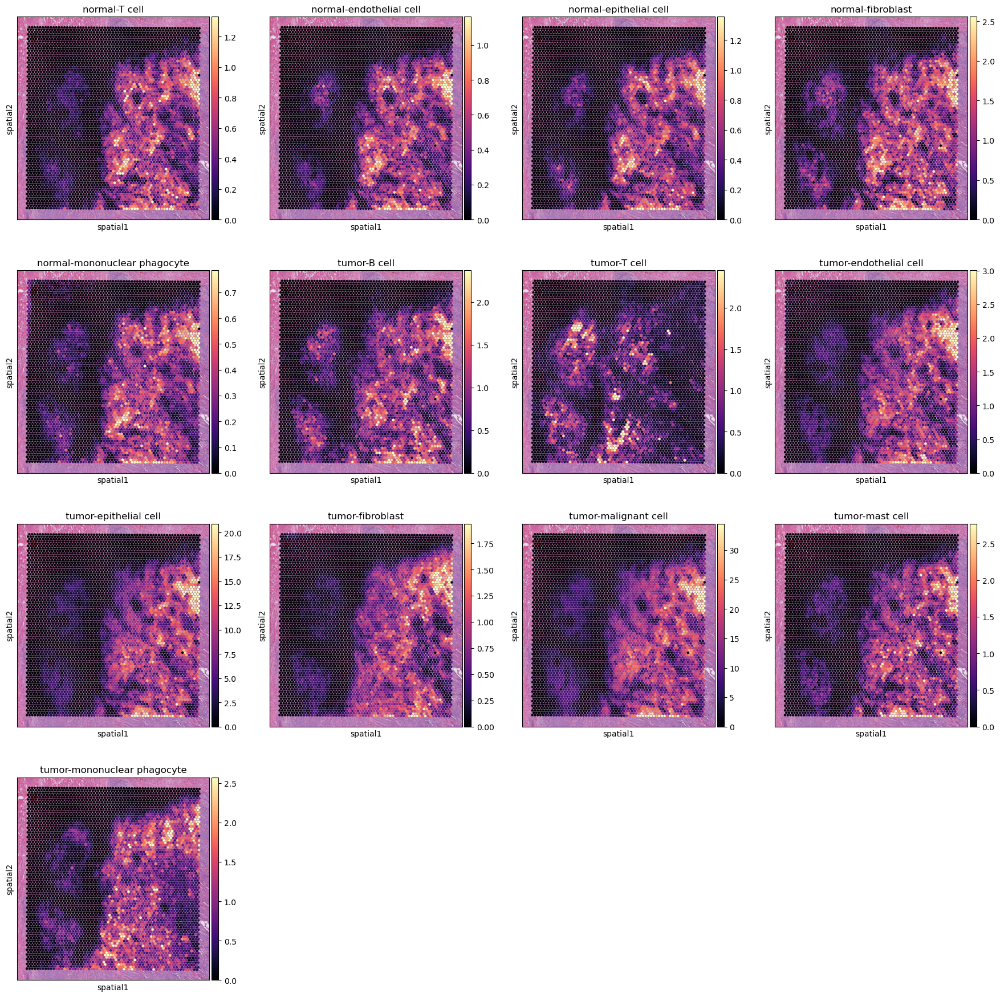

In [71]:
# plot in spatial coordinates
with mpl.rc_context({"axes.facecolor": "black", "figure.figsize": [4.5, 5]}):
    sc.pl.spatial(
        adata_vis,
        cmap="magma",
        # show first 8 cell types
        # color=[
        #     "normal-T cell",
        #     "normal-epithelial cell",
        #     "normal-fibroblast",
        #     "tumor-endothelial cell",
        #     "tumor-T cell",
        #     "tumor-epithelial cell",
        #     "tumor-fibroblast",
        #     "tumor-malignant cell",
        # ],
        color=adata_vis.uns["mod"]["factor_names"].tolist(),
        ncols=4,
        size=1.3,
        img_key="hires",
        # limit color scale at 99.2% quantile of cell abundance
        vmin=0,
        vmax="p99.2",
        show=False,
    )
    # plt.gcf().savefig(os.path.join(map_results_dir, f"cell_abundance_{slide}.png"))
    # plt.close()
    plt.show()

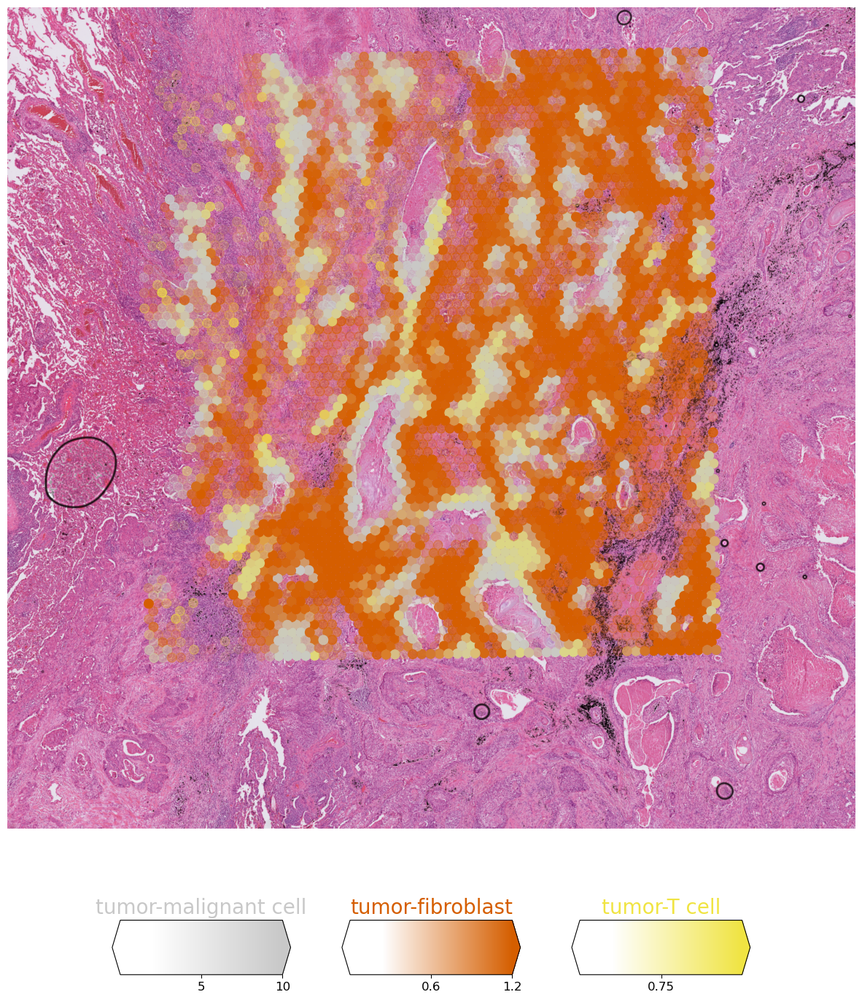

In [20]:
clust_labels = [
    "tumor-malignant cell",
    "tumor-fibroblast",
    "tumor-T cell",
]
with mpl.rc_context({"figure.figsize": (15, 18)}):
    fig = cell2loc.plt.plot_spatial(
        adata=adata_vis,
        # labels to show on a plot
        color=clust_labels,
        labels=clust_labels,
        reorder_cmap=[5, 1, 0],
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style="fast",
        # limit color scale at 99.2% quantile of cell abundance
        max_col=[10, 1.2, 1.8],
        # max_color_quantile=0.95,
        # size of locations (adjust depending on figure size)
        circle_diameter=9,
        colorbar_position="bottom",
        colorbar_shape={
            "vertical_gaps": 0.1,
            "horizontal_gaps": 0.4,
            "width": 1,
            "height": 0.06,
        },
    )
    # plt.gcf().savefig(
    #     os.path.join(map_results_dir, f"cell_abundance_white_{slide}.png")
    # )
    # plt.close()
    plt.show()

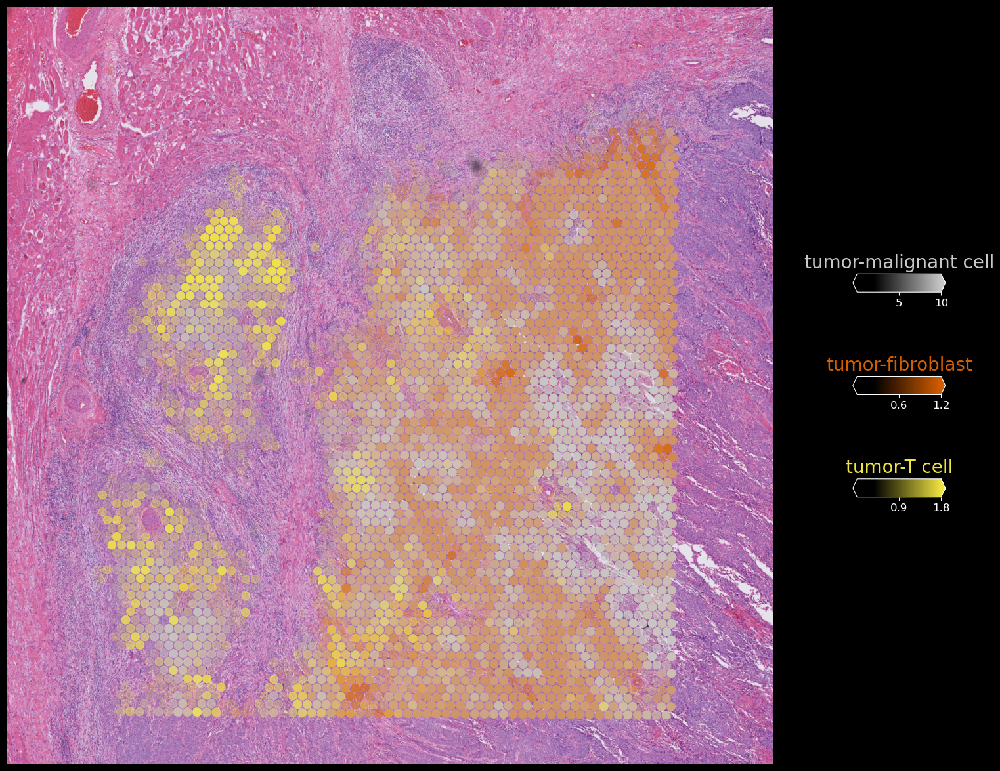

In [ ]:
with mpl.rc_context({"figure.figsize": (20, 15)}):
    fig = cell2loc.plt.plot_spatial(
        adata=adata_vis,
        # labels to show on a plot
        color=clust_labels,
        labels=clust_labels,
        reorder_cmap=[5, 1, 0],
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style="dark_background",
        # limit color scale at 99.2% quantile of cell abundance
        max_col=[10, 1.2, 1.8],
        # max_color_quantile=0.95,
        # size of locations (adjust depending on figure size)
        circle_diameter=9,
        colorbar_position="bottom",
        colorbar_shape={
            "vertical_gaps": 1,
            "horizontal_gaps": 0.001,
            "width": 0.1,
            "height": 0.1,
        },
    )
    # plt.gcf().savefig(
    #     os.path.join(map_results_dir, f"cell_abundance_white_{slide}.png")
    # )
    # plt.close()
    plt.show()